<a href="https://colab.research.google.com/github/pavankalyan1997/Advanced-Machine-Learning-Assignments/blob/master/week6_image_captioning.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Image Captioning Final Project

In this final project you will define and train an image-to-caption model, that can produce descriptions for real world images!

<img src="https://github.com/hse-aml/intro-to-dl/blob/master/week6/images/encoder_decoder.png?raw=1" style="width:70%">

Model architecture: CNN encoder and RNN decoder. 
(https://research.googleblog.com/2014/11/a-picture-is-worth-thousand-coherent.html)

# Import stuff

In [1]:
! shred -u setup_google_colab.py
! wget https://raw.githubusercontent.com/hse-aml/intro-to-dl/master/setup_google_colab.py -O setup_google_colab.py
import setup_google_colab
# please, uncomment the week you're working on
# setup_google_colab.setup_week1()
# setup_google_colab.setup_week2()
# setup_google_colab.setup_week3()
# setup_google_colab.setup_week4()
# setup_google_colab.setup_week5()
setup_google_colab.setup_week6()

# If you're using the old version of the course (check a path of notebook on Coursera, you'll see v1 or v2),
# use setup_week2_old().

shred: setup_google_colab.py: failed to open for writing: No such file or directory
--2019-08-24 18:23:05--  https://raw.githubusercontent.com/hse-aml/intro-to-dl/master/setup_google_colab.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 151.101.0.133, 151.101.64.133, 151.101.128.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|151.101.0.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 3792 (3.7K) [text/plain]
Saving to: ‘setup_google_colab.py’

setup_google_colab. 100%[===================>]   3.70K  --.-KB/s    in 0s      

2019-08-24 18:23:11 (100 MB/s) - ‘setup_google_colab.py’ saved [3792/3792]

**************************************************
captions_train-val2014.zip
**************************************************
train2014_sample.zip
**************************************************
train_img_embeds.pickle
**************************************************
train_img_fns.pickle
******************

In [0]:
import sys
sys.path.append("..")
import grading
import download_utils

In [0]:
download_utils.link_all_keras_resources()

In [4]:
import tensorflow as tf
from tensorflow.contrib import keras
import numpy as np
%matplotlib inline
import matplotlib.pyplot as plt
L = keras.layers
K = keras.backend
import utils
import time
import zipfile
import json
from collections import defaultdict
import re
import random
from random import choice
import grading_utils
import os
from keras_utils import reset_tf_session
import tqdm_utils

Using TensorFlow backend.


# Prepare the storage for model checkpoints

In [5]:
# Leave USE_GOOGLE_DRIVE = False if you're running locally!
# We recommend to set USE_GOOGLE_DRIVE = True in Google Colab!
# If set to True, we will mount Google Drive, so that you can restore your checkpoint 
# and continue trainig even if your previous Colab session dies.
# If set to True, follow on-screen instructions to access Google Drive (you must have a Google account).
USE_GOOGLE_DRIVE = True

def mount_google_drive():
    from google.colab import drive
    mount_directory = "/content/gdrive"
    drive.mount(mount_directory)
    drive_root = mount_directory + "/" + list(filter(lambda x: x[0] != '.', os.listdir(mount_directory)))[0] + "/colab"
    return drive_root

CHECKPOINT_ROOT = ""
if USE_GOOGLE_DRIVE:
    CHECKPOINT_ROOT = mount_google_drive() + "/"

def get_checkpoint_path(epoch=None):
    if epoch is None:
        return os.path.abspath(CHECKPOINT_ROOT + "weights")
    else:
        return os.path.abspath(CHECKPOINT_ROOT + "weights_{}".format(epoch))
      
# example of checkpoint dir
print(get_checkpoint_path(10))

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=email%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdocs.test%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive.photos.readonly%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/gdrive
/content/gdrive/My Drive/colab/weights_10


# Fill in your Coursera token and email
To successfully submit your answers to our grader, please fill in your Coursera submission token and email

In [0]:
grader = grading.Grader(assignment_key="NEDBg6CgEee8nQ6uE8a7OA", 
                        all_parts=["19Wpv", "uJh73", "yiJkt", "rbpnH", "E2OIL", "YJR7z"])

In [0]:
# token expires every 30 min
COURSERA_TOKEN = "LGfooKbnqfVypSFI"
COURSERA_EMAIL = "pavankalyan.urandur2@gmail.com"

# Download data

Takes 10 hours and 20 GB. We've downloaded necessary files for you.

Relevant links (just in case):
- train images http://msvocds.blob.core.windows.net/coco2014/train2014.zip
- validation images http://msvocds.blob.core.windows.net/coco2014/val2014.zip
- captions for both train and validation http://msvocds.blob.core.windows.net/annotations-1-0-3/captions_train-val2014.zip

In [0]:
# we downloaded them for you, just link them here
download_utils.link_week_6_resources()

# Extract image features

We will use pre-trained InceptionV3 model for CNN encoder (https://research.googleblog.com/2016/03/train-your-own-image-classifier-with.html) and extract its last hidden layer as an embedding:

<img src="https://github.com/hse-aml/intro-to-dl/blob/master/week6/images/inceptionv3.png?raw=1" style="width:70%">

In [0]:
IMG_SIZE = 299

In [0]:
# we take the last hidden layer of IncetionV3 as an image embedding
def get_cnn_encoder():
    K.set_learning_phase(False)
    model = keras.applications.InceptionV3(include_top=False)
    preprocess_for_model = keras.applications.inception_v3.preprocess_input

    model = keras.models.Model(model.inputs, keras.layers.GlobalAveragePooling2D()(model.output))
    return model, preprocess_for_model

Features extraction takes too much time on CPU:
- Takes 16 minutes on GPU.
- 25x slower (InceptionV3) on CPU and takes 7 hours.
- 10x slower (MobileNet) on CPU and takes 3 hours.

So we've done it for you with the following code:
```python
# load pre-trained model
reset_tf_session()
encoder, preprocess_for_model = get_cnn_encoder()

# extract train features
train_img_embeds, train_img_fns = utils.apply_model(
    "train2014.zip", encoder, preprocess_for_model, input_shape=(IMG_SIZE, IMG_SIZE))
utils.save_pickle(train_img_embeds, "train_img_embeds.pickle")
utils.save_pickle(train_img_fns, "train_img_fns.pickle")

# extract validation features
val_img_embeds, val_img_fns = utils.apply_model(
    "val2014.zip", encoder, preprocess_for_model, input_shape=(IMG_SIZE, IMG_SIZE))
utils.save_pickle(val_img_embeds, "val_img_embeds.pickle")
utils.save_pickle(val_img_fns, "val_img_fns.pickle")

# sample images for learners
def sample_zip(fn_in, fn_out, rate=0.01, seed=42):
    np.random.seed(seed)
    with zipfile.ZipFile(fn_in) as fin, zipfile.ZipFile(fn_out, "w") as fout:
        sampled = filter(lambda _: np.random.rand() < rate, fin.filelist)
        for zInfo in sampled:
            fout.writestr(zInfo, fin.read(zInfo))
            
sample_zip("train2014.zip", "train2014_sample.zip")
sample_zip("val2014.zip", "val2014_sample.zip")
```

In [10]:
# load prepared embeddings
train_img_embeds = utils.read_pickle("train_img_embeds.pickle")
train_img_fns = utils.read_pickle("train_img_fns.pickle")
val_img_embeds = utils.read_pickle("val_img_embeds.pickle")
val_img_fns = utils.read_pickle("val_img_fns.pickle")
# check shapes
print(train_img_embeds.shape, len(train_img_fns))
print(val_img_embeds.shape, len(val_img_fns))

(82783, 2048) 82783
(40504, 2048) 40504


In [11]:
# check prepared samples of images
list(filter(lambda x: x.endswith("_sample.zip"), os.listdir(".")))

['val2014_sample.zip', 'train2014_sample.zip']

# Extract captions for images

In [12]:
# extract captions from zip
def get_captions_for_fns(fns, zip_fn, zip_json_path):
    zf = zipfile.ZipFile(zip_fn)
    j = json.loads(zf.read(zip_json_path).decode("utf8"))
    id_to_fn = {img["id"]: img["file_name"] for img in j["images"]}
    fn_to_caps = defaultdict(list)
    for cap in j['annotations']:
        fn_to_caps[id_to_fn[cap['image_id']]].append(cap['caption'])
    fn_to_caps = dict(fn_to_caps)
    return list(map(lambda x: fn_to_caps[x], fns))
    
train_captions = get_captions_for_fns(train_img_fns, "captions_train-val2014.zip", 
                                      "annotations/captions_train2014.json")

val_captions = get_captions_for_fns(val_img_fns, "captions_train-val2014.zip", 
                                      "annotations/captions_val2014.json")

# check shape
print(len(train_img_fns), len(train_captions))
print(len(val_img_fns), len(val_captions))

82783 82783
40504 40504


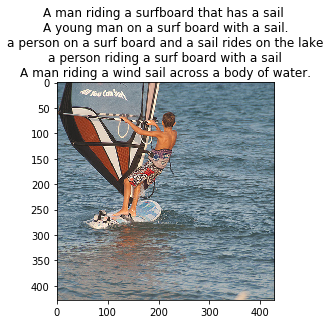

In [13]:
# look at training example (each has 5 captions)
def show_trainig_example(train_img_fns, train_captions, example_idx=0):
    """
    You can change example_idx and see different images
    """
    zf = zipfile.ZipFile("train2014_sample.zip")
    captions_by_file = dict(zip(train_img_fns, train_captions))
    all_files = set(train_img_fns)
    found_files = list(filter(lambda x: x.filename.rsplit("/")[-1] in all_files, zf.filelist))
    example = found_files[example_idx]
    img = utils.decode_image_from_buf(zf.read(example))
    plt.imshow(utils.image_center_crop(img))
    plt.title("\n".join(captions_by_file[example.filename.rsplit("/")[-1]]))
    plt.show()
    
show_trainig_example(train_img_fns, train_captions, example_idx=12)

# Prepare captions for training

In [14]:
# preview captions data
train_captions[:2]

[['A long dirt road going through a forest.',
  'A SCENE OF WATER AND A PATH WAY',
  'A sandy path surrounded by trees leads to a beach.',
  'Ocean view through a dirt road surrounded by a forested area. ',
  'dirt path leading beneath barren trees to open plains'],
 ['A group of zebra standing next to each other.',
  'This is an image of of zebras drinking',
  'ZEBRAS AND BIRDS SHARING THE SAME WATERING HOLE',
  'Zebras that are bent over and drinking water together.',
  'a number of zebras drinking water near one another']]

In [0]:
# special tokens
PAD = "#PAD#"
UNK = "#UNK#"
START = "#START#"
END = "#END#"

# split sentence into tokens (split into lowercased words)
def split_sentence(sentence):
    return list(filter(lambda x: len(x) > 0, re.split('\W+', sentence.lower())))

def generate_vocabulary(train_captions):
    """
    Return {token: index} for all train tokens (words) that occur 5 times or more, 
        `index` should be from 0 to N, where N is a number of unique tokens in the resulting dictionary.
    Use `split_sentence` function to split sentence into tokens.
    Also, add PAD (for batch padding), UNK (unknown, out of vocabulary), 
        START (start of sentence) and END (end of sentence) tokens into the vocabulary.
    """
    temp={}
    vocab=[]
    for i in range(len(train_captions)):
      for j in range(len(train_captions[i])):
        for k in split_sentence(train_captions[i][j]):
          if k not in temp:
            temp[k]=1
          else:temp[k]=temp[k]+1
    for each in temp:
      if temp[each]>=5:
        vocab.append(each)
    
    vocab.append(PAD)
    vocab.append(UNK)
    vocab.append(START)
    vocab.append(END)
    
            
    
    return {token: index for index, token in enumerate(sorted(vocab))}
    
def caption_tokens_to_indices(captions, vocab):
    """
    `captions` argument is an array of arrays:
    [
        [
            "image1 caption1",
            "image1 caption2",
            ...
        ],
        [
            "image2 caption1",
            "image2 caption2",
            ...
        ],
        ...
    ]
    Use `split_sentence` function to split sentence into tokens.
    Replace all tokens with vocabulary indices, use UNK for unknown words (out of vocabulary).
    Add START and END tokens to start and end of each sentence respectively.
    For the example above you should produce the following:
    [
        [
            [vocab[START], vocab["image1"], vocab["caption1"], vocab[END]],
            [vocab[START], vocab["image1"], vocab["caption2"], vocab[END]],
            ...
        ],
        ...
    ]
    """
    res=[]
    for i in range(len(captions)):
      temp=[]
      for j in range(len(captions[i])):
        sent_list=[]
        sent_list.append(vocab[START])
        for word in split_sentence(captions[i][j]):
          if(word not in vocab):
            sent_list.append(vocab[UNK])
          else:
            sent_list.append(vocab[word])
        sent_list.append(vocab[END])
        temp.append(sent_list)
      res.append(temp)
      
      
        
   
    return res

In [16]:
# prepare vocabulary
vocab = generate_vocabulary(train_captions)
vocab_inverse = {idx: w for w, idx in vocab.items()}
print(len(vocab))

8769


In [0]:
# replace tokens with indices
train_captions_indexed = caption_tokens_to_indices(train_captions, vocab)
val_captions_indexed = caption_tokens_to_indices(val_captions, vocab)

In [18]:
len(train_captions)

82783

In [19]:
train_captions[1200]

['A clock tower is on an old brown building.',
 'A large building with a tower and a clock.',
 'A clock tower is shown attached to a building.',
 'Gloomy blue crowds are over a clock tower. ',
 'A large building with a large clock at the top .']

In [20]:
train_captions_indexed[1200]

[[2, 54, 1550, 7993, 3998, 5155, 242, 5146, 1002, 1045, 0],
 [2, 54, 4244, 1045, 8647, 54, 7993, 249, 54, 1550, 0],
 [2, 54, 1550, 7993, 3998, 6804, 413, 7905, 54, 1045, 0],
 [2, 3331, 826, 1987, 330, 5254, 54, 1550, 7993, 0],
 [2, 54, 4244, 1045, 8647, 54, 4244, 1550, 402, 7804, 7953, 0]]

Captions have different length, but we need to batch them, that's why we will add PAD tokens so that all sentences have an equal length. 

We will crunch LSTM through all the tokens, but we will ignore padding tokens during loss calculation.

In [0]:
# we will use this during training
def batch_captions_to_matrix(batch_captions, pad_idx, max_len=None):
    """
    `batch_captions` is an array of arrays:
    [
        [vocab[START], ..., vocab[END]],
        [vocab[START], ..., vocab[END]],
        ...
    ]
    Put vocabulary indexed captions into np.array of shape (len(batch_captions), columns),
        where "columns" is max(map(len, batch_captions)) when max_len is None
        and "columns" = min(max_len, max(map(len, batch_captions))) otherwise.
    Add padding with pad_idx where necessary.
    Input example: [[1, 2, 3], [4, 5]]
    Output example: np.array([[1, 2, 3], [4, 5, pad_idx]]) if max_len=None
    Output example: np.array([[1, 2], [4, 5]]) if max_len=2
    Output example: np.array([[1, 2, 3], [4, 5, pad_idx]]) if max_len=100
    Try to use numpy, we need this function to be fast!
    """
    #matrix = ###YOUR CODE HERE###
    matrix=[]
    lMax=max([len(i) for i in batch_captions])
    size=0
    if max_len==None:
        size=lMax
    else: size=min(lMax,max_len)
    for i in range(len(batch_captions)):
        if len(batch_captions[i])<=size:
            pad=np.ones((size-len(batch_captions[i])),dtype=int)*pad_idx
            temp=np.append(np.array(batch_captions[i]),pad)
            
        else:
             temp=np.array(batch_captions[i])
             temp=temp[:size]
            
        matrix.append(temp)
    return np.array(matrix)
    

In [22]:
sample=train_captions_indexed[1200]
padded_sample=batch_captions_to_matrix(sample, vocab[PAD], max_len=None)
print(padded_sample)

[[   2   54 1550 7993 3998 5155  242 5146 1002 1045    0    1]
 [   2   54 4244 1045 8647   54 7993  249   54 1550    0    1]
 [   2   54 1550 7993 3998 6804  413 7905   54 1045    0    1]
 [   2 3331  826 1987  330 5254   54 1550 7993    0    1    1]
 [   2   54 4244 1045 8647   54 4244 1550  402 7804 7953    0]]


In [0]:
## GRADED PART, DO NOT CHANGE!
# Vocabulary creation
grader.set_answer("19Wpv", grading_utils.test_vocab(vocab, PAD, UNK, START, END))
# Captions indexing
grader.set_answer("uJh73", grading_utils.test_captions_indexing(train_captions_indexed, vocab, UNK))
# Captions batching
grader.set_answer("yiJkt", grading_utils.test_captions_batching(batch_captions_to_matrix))

In [25]:
# you can make submission with answers so far to check yourself at this stage
grader.submit(COURSERA_EMAIL, COURSERA_TOKEN)

You used an invalid email or your token may have expired. Please make sure you have entered all fields correctly. Try generating a new token if the issue still persists.


In [0]:
# make sure you use correct argument in caption_tokens_to_indices
assert len(caption_tokens_to_indices(train_captions[:10], vocab)) == 10
assert len(caption_tokens_to_indices(train_captions[:5], vocab)) == 5

# Training

## Define architecture

Since our problem is to generate image captions, RNN text generator should be conditioned on image. The idea is to use image features as an initial state for RNN instead of zeros. 

Remember that you should transform image feature vector to RNN hidden state size by fully-connected layer and then pass it to RNN.

During training we will feed ground truth tokens into the lstm to get predictions of next tokens. 

Notice that we don't need to feed last token (END) as input (http://cs.stanford.edu/people/karpathy/):

<img src="https://github.com/hse-aml/intro-to-dl/blob/master/week6/images/encoder_decoder_explained.png?raw=1" style="width:50%">

In [29]:
IMG_EMBED_SIZE = train_img_embeds.shape[1]
print(IMG_EMBED_SIZE)
IMG_EMBED_BOTTLENECK = 120
WORD_EMBED_SIZE = 100
LSTM_UNITS = 300
LOGIT_BOTTLENECK = 120
pad_idx = vocab[PAD]

2048


In [28]:
# remember to reset your graph if you want to start building it from scratch!
s = reset_tf_session()
tf.set_random_seed(42)

W0824 18:28:48.747200 140451610974080 deprecation_wrapper.py:119] From /content/keras_utils.py:68: The name tf.get_default_session is deprecated. Please use tf.compat.v1.get_default_session instead.

W0824 18:28:48.749442 140451610974080 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:79: The name tf.reset_default_graph is deprecated. Please use tf.compat.v1.reset_default_graph instead.

W0824 18:28:48.751231 140451610974080 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:82: The name tf.placeholder is deprecated. Please use tf.compat.v1.placeholder instead.

W0824 18:28:48.766722 140451610974080 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:84: The name tf.get_default_graph is deprecated. Please use tf.compat.v1.get_default_graph instead.

W0824 18:28:48.767562 140451610974080 deprecation_wrapper.py:119] F

Here we define decoder graph.

We use Keras layers where possible because we can use them in functional style with weights reuse like this:
```python
dense_layer = L.Dense(42, input_shape=(None, 100) activation='relu')
a = tf.placeholder('float32', [None, 100])
b = tf.placeholder('float32', [None, 100])
dense_layer(a)  # that's how we applied dense layer!
dense_layer(b)  # and again
```

Here's a figure to help you with flattening in decoder:
<img src="https://github.com/hse-aml/intro-to-dl/blob/master/week6/images/flatten_help.jpg?raw=1" style="width:80%">

In [30]:
class decoder:
    # [batch_size, IMG_EMBED_SIZE] of CNN image features
    img_embeds = tf.placeholder('float32', [None, IMG_EMBED_SIZE])
    # [batch_size, time steps] of word ids
    sentences = tf.placeholder('int32', [None, None])
    
    # we use bottleneck here to reduce the number of parameters
    # image embedding -> bottleneck
    img_embed_to_bottleneck = L.Dense(IMG_EMBED_BOTTLENECK, 
                                      input_shape=(None, IMG_EMBED_SIZE), 
                                      activation='elu')
    # image embedding bottleneck -> lstm initial state
    img_embed_bottleneck_to_h0 = L.Dense(LSTM_UNITS,
                                         input_shape=(None, IMG_EMBED_BOTTLENECK),
                                         activation='elu')
    # word -> embedding
    word_embed = L.Embedding(len(vocab), WORD_EMBED_SIZE)
    # lstm cell (from tensorflow)
    lstm = tf.nn.rnn_cell.LSTMCell(LSTM_UNITS)
    
    # we use bottleneck here to reduce model complexity
    # lstm output -> logits bottleneck
    token_logits_bottleneck = L.Dense(LOGIT_BOTTLENECK, 
                                      input_shape=(None, LSTM_UNITS),
                                      activation="elu")
    # logits bottleneck -> logits for next token prediction
    token_logits = L.Dense(len(vocab),
                           input_shape=(None, LOGIT_BOTTLENECK))
    
    # initial lstm cell state of shape (None, LSTM_UNITS),
    # we need to condition it on `img_embeds` placeholder.
    c0 = h0 = img_embed_bottleneck_to_h0(img_embed_to_bottleneck(img_embeds))### YOUR CODE HERE ###

    # embed all tokens but the last for lstm input,
    # remember that L.Embedding is callable,
    # use `sentences` placeholder as input.
    word_embeds = word_embed(sentences[:,:-1])### YOUR CODE HERE ###
    
    # during training we use ground truth tokens `word_embeds` as context for next token prediction.
    # that means that we know all the inputs for our lstm and can get 
    # all the hidden states with one tensorflow operation (tf.nn.dynamic_rnn).
    # `hidden_states` has a shape of [batch_size, time steps, LSTM_UNITS].
    hidden_states, _ = tf.nn.dynamic_rnn(lstm, word_embeds,
                                         initial_state=tf.nn.rnn_cell.LSTMStateTuple(c0, h0))

    # now we need to calculate token logits for all the hidden states
    
    # first, we reshape `hidden_states` to [-1, LSTM_UNITS]
    flat_hidden_states =tf.reshape(hidden_states,[-1,LSTM_UNITS])### YOUR CODE HERE ###

    # then, we calculate logits for next tokens using `token_logits_bottleneck` and `token_logits` layers
    flat_token_logits = token_logits(token_logits_bottleneck(flat_hidden_states))### YOUR CODE HERE ###
    
    # then, we flatten the ground truth token ids.
    # remember, that we predict next tokens for each time step,
    # use `sentences` placeholder.
    flat_ground_truth = tf.reshape(sentences[:, 1:], [-1])### YOUR CODE HERE ###

    # we need to know where we have real tokens (not padding) in `flat_ground_truth`,
    # we don't want to propagate the loss for padded output tokens,
    # fill `flat_loss_mask` with 1.0 for real tokens (not pad_idx) and 0.0 otherwise.
    flat_loss_mask = tf.not_equal(flat_ground_truth,pad_idx)### YOUR CODE HERE ###

    # compute cross-entropy between `flat_ground_truth` and `flat_token_logits` predicted by lstm
    xent = tf.nn.sparse_softmax_cross_entropy_with_logits(
        labels=flat_ground_truth, 
        logits=flat_token_logits
    )

    # compute average `xent` over tokens with nonzero `flat_loss_mask`.
    # we don't want to account misclassification of PAD tokens, because that doesn't make sense,
    # we have PAD tokens for batching purposes only!
    loss = tf.reduce_mean(tf.boolean_mask(xent, flat_loss_mask))### YOUR CODE HERE ###

W0824 18:40:30.371069 140451610974080 deprecation.py:506] From /usr/local/lib/python3.6/dist-packages/tensorflow/python/ops/init_ops.py:1251: calling VarianceScaling.__init__ (from tensorflow.python.ops.init_ops) with dtype is deprecated and will be removed in a future version.
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
W0824 18:40:30.377339 140451610974080 deprecation.py:506] From /usr/local/lib/python3.6/dist-packages/tensorflow/python/keras/initializers.py:119: calling RandomUniform.__init__ (from tensorflow.python.ops.init_ops) with dtype is deprecated and will be removed in a future version.
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
W0824 18:40:30.381325 140451610974080 deprecation.py:323] From <ipython-input-30-8e7cd121dd40>:19: LSTMCell.__init__ (from tensorflow.python.ops.rnn_cell_impl) is deprecated and will be removed in a futu

In [0]:
# define optimizer operation to minimize the loss
optimizer = tf.train.AdamOptimizer(learning_rate=0.001)
train_step = optimizer.minimize(decoder.loss)

# will be used to save/load network weights.
# you need to reset your default graph and define it in the same way to be able to load the saved weights!
saver = tf.train.Saver()

# intialize all variables
s.run(tf.global_variables_initializer())

In [0]:
## GRADED PART, DO NOT CHANGE!
# Decoder shapes test
grader.set_answer("rbpnH", grading_utils.test_decoder_shapes(decoder, IMG_EMBED_SIZE, vocab, s))
# Decoder random loss test
grader.set_answer("E2OIL", grading_utils.test_random_decoder_loss(decoder, IMG_EMBED_SIZE, vocab, s))

In [49]:
# you can make submission with answers so far to check yourself at this stage
grader.submit(COURSERA_EMAIL, COURSERA_TOKEN)

Submitted to Coursera platform. See results on assignment page!


## Training loop
Evaluate train and validation metrics through training and log them. Ensure that loss decreases.

In [0]:
train_captions_indexed = np.array(train_captions_indexed)
val_captions_indexed = np.array(val_captions_indexed)

In [35]:
train_captions_indexed[0]

[[2, 54, 4462, 2305, 6328, 3354, 7848, 54, 3107, 0],
 [2, 54, 6540, 5127, 8486, 249, 54, 5437, 8507, 0],
 [2, 54, 6502, 5437, 7581, 1124, 8052, 4287, 7905, 54, 639, 0],
 [2, 5120, 8367, 7848, 54, 2305, 6328, 7581, 1124, 54, 3108, 331, 0],
 [2, 2305, 5437, 4286, 710, 587, 8052, 7905, 5174, 5684, 0]]

In [0]:
# generate batch via random sampling of images and captions for them,
# we use `max_len` parameter to control the length of the captions (truncating long captions)
def generate_batch(images_embeddings, indexed_captions, batch_size, max_len=None):
    """
    `images_embeddings` is a np.array of shape [number of images, IMG_EMBED_SIZE].
    `indexed_captions` holds 5 vocabulary indexed captions for each image:
    [
        [
            [vocab[START], vocab["image1"], vocab["caption1"], vocab[END]],
            [vocab[START], vocab["image1"], vocab["caption2"], vocab[END]],
            ...
        ],
        ...
    ]
    Generate a random batch of size `batch_size`.
    Take random images and choose one random caption for each image.
    Remember to use `batch_captions_to_matrix` for padding and respect `max_len` parameter.
    Return feed dict {decoder.img_embeds: ..., decoder.sentences: ...}.
    """
    
    n=images_embeddings.shape[0]
    rand_indices= random.sample(range(n),batch_size)
    batch_image_embeddings = images_embeddings[rand_indices]### YOUR CODE HERE ###
    random_captions=indexed_captions[rand_indices]
    random_captions_single=[]
    for caption in random_captions:
      random_captions_single.append(caption[np.random.randint(5)])
    
    
    
    batch_captions_matrix = batch_captions_to_matrix(random_captions_single,vocab[PAD],max_len)
    
    return {decoder.img_embeds: batch_image_embeddings, 
            decoder.sentences: batch_captions_matrix}

In [0]:
batch_size = 64
n_epochs = 12
n_batches_per_epoch = 1000
n_validation_batches = 100  # how many batches are used for validation after each epoch

In [0]:
# you can load trained weights here
# uncomment the next line if you need to load weights
# saver.restore(s, get_checkpoint_path(epoch=4))

Look at the training and validation loss, they should be decreasing!

In [46]:
# actual training loop
MAX_LEN = 20  # truncate long captions to speed up training

# to make training reproducible
np.random.seed(42)
random.seed(42)

for epoch in range(n_epochs):
    
    train_loss = 0
    pbar = tqdm_utils.tqdm_notebook_failsafe(range(n_batches_per_epoch))
    counter = 0
    for _ in pbar:
        train_loss += s.run([decoder.loss, train_step], 
                            generate_batch(train_img_embeds, 
                                           train_captions_indexed, 
                                           batch_size, 
                                           MAX_LEN))[0]
        counter += 1
        pbar.set_description("Training loss: %f" % (train_loss / counter))
        
    train_loss /= n_batches_per_epoch
    
    val_loss = 0
    for _ in range(n_validation_batches):
        val_loss += s.run(decoder.loss, generate_batch(val_img_embeds,
                                                       val_captions_indexed, 
                                                       batch_size, 
                                                       MAX_LEN))
    val_loss /= n_validation_batches
    
    print('Epoch: {}, train loss: {}, val loss: {}'.format(epoch, train_loss, val_loss))

    # save weights after finishing epoch
    saver.save(s, get_checkpoint_path(epoch))
    
print("Finished!")

**************************************************
Training loss: 4.244987
Epoch: 0, train loss: 4.244986929178238, val loss: 3.6592756342887878
**************************************************
Training loss: 3.335606
Epoch: 1, train loss: 3.335606307029724, val loss: 3.1465786576271055
**************************************************
Training loss: 3.010281
Epoch: 2, train loss: 3.010280748128891, val loss: 2.9757473492622375
**************************************************
Training loss: 2.850410
Epoch: 3, train loss: 2.850409685134888, val loss: 2.8353999352455137
**************************************************
Training loss: 2.756190
Epoch: 4, train loss: 2.7561900300979616, val loss: 2.798766133785248
**************************************************
Training loss: 2.694727


W0824 19:17:54.345248 140451610974080 deprecation.py:323] From /usr/local/lib/python3.6/dist-packages/tensorflow/python/training/saver.py:960: remove_checkpoint (from tensorflow.python.training.checkpoint_management) is deprecated and will be removed in a future version.
Instructions for updating:
Use standard file APIs to delete files with this prefix.


Epoch: 5, train loss: 2.6947268314361574, val loss: 2.7443893694877626
**************************************************
Training loss: 2.640626
Epoch: 6, train loss: 2.640626008987427, val loss: 2.7270033669471743
**************************************************
Training loss: 2.604411
Epoch: 7, train loss: 2.6044105665683746, val loss: 2.655059401988983
**************************************************
Training loss: 2.557787
Epoch: 8, train loss: 2.5577872099876404, val loss: 2.6490647697448733
**************************************************
Training loss: 2.535464
Epoch: 9, train loss: 2.5354644367694856, val loss: 2.6069748997688293
**************************************************
Training loss: 2.507660
Epoch: 10, train loss: 2.5076596500873567, val loss: 2.6024399471282957
**************************************************
Training loss: 2.489141
Epoch: 11, train loss: 2.4891405487060547, val loss: 2.5838682508468627
Finished!


In [47]:
## GRADED PART, DO NOT CHANGE!
# Validation loss
grader.set_answer("YJR7z", grading_utils.test_validation_loss(
    decoder, s, generate_batch, val_img_embeds, val_captions_indexed))

**************************************************



In [0]:
# you can make submission with answers so far to check yourself at this stage
grader.submit(COURSERA_EMAIL, COURSERA_TOKEN)

In [50]:
# check that it's learnt something, outputs accuracy of next word prediction (should be around 0.5)
from sklearn.metrics import accuracy_score, log_loss

def decode_sentence(sentence_indices):
    return " ".join(list(map(vocab_inverse.get, sentence_indices)))

def check_after_training(n_examples):
    fd = generate_batch(train_img_embeds, train_captions_indexed, batch_size)
    logits = decoder.flat_token_logits.eval(fd)
    truth = decoder.flat_ground_truth.eval(fd)
    mask = decoder.flat_loss_mask.eval(fd).astype(bool)
    print("Loss:", decoder.loss.eval(fd))
    print("Accuracy:", accuracy_score(logits.argmax(axis=1)[mask], truth[mask]))
    for example_idx in range(n_examples):
        print("Example", example_idx)
        print("Predicted:", decode_sentence(logits.argmax(axis=1).reshape((batch_size, -1))[example_idx]))
        print("Truth:", decode_sentence(truth.reshape((batch_size, -1))[example_idx]))
        print("")

check_after_training(3)

Loss: 2.5343132
Accuracy: 0.503382949932341
Example 0
Predicted: a person boy riding a on a wave #END# surf ocean #END# #END# #END# #END# #END# #END# #END# #END# #END# #END# #END# #END# #END# #END# #END# #END#
Truth: a young man having fun riding a wave to the shore #END# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD#

Example 1
Predicted: a office of a living sitting a of a couch #END# #END# #END# #END# #END# #END# and and and and and and and and and and and
Truth: an image of a cat on top of a couch #END# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD#

Example 2
Predicted: a boys men playing a grass field playing playing in a ball #END# #END# #END# #END# #END# #END# #END# #END# #END# #END# #END# #END# #END# #END# #END#
Truth: two young boys on the soccer field are competing for the ball #END# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD#



In [51]:
# save last graph weights to file!
saver.save(s, get_checkpoint_path())

'/content/gdrive/My Drive/colab/weights'

# Applying model

Here we construct a graph for our final model.

It will work as follows:
- take an image as an input and embed it
- condition lstm on that embedding
- predict the next token given a START input token
- use predicted token as an input at next time step
- iterate until you predict an END token

In [52]:
class final_model:
    # CNN encoder
    encoder, preprocess_for_model = get_cnn_encoder()
    saver.restore(s, get_checkpoint_path())  # keras applications corrupt our graph, so we restore trained weights
    
    # containers for current lstm state
    lstm_c = tf.Variable(tf.zeros([1, LSTM_UNITS]), name="cell")
    lstm_h = tf.Variable(tf.zeros([1, LSTM_UNITS]), name="hidden")

    # input images
    input_images = tf.placeholder('float32', [1, IMG_SIZE, IMG_SIZE, 3], name='images')

    # get image embeddings
    img_embeds = encoder(input_images)

    # initialize lstm state conditioned on image
    init_c = init_h = decoder.img_embed_bottleneck_to_h0(decoder.img_embed_to_bottleneck(img_embeds))
    init_lstm = tf.assign(lstm_c, init_c), tf.assign(lstm_h, init_h)
    
    # current word index
    current_word = tf.placeholder('int32', [1], name='current_input')

    # embedding for current word
    word_embed = decoder.word_embed(current_word)

    # apply lstm cell, get new lstm states
    new_c, new_h = decoder.lstm(word_embed, tf.nn.rnn_cell.LSTMStateTuple(lstm_c, lstm_h))[1]

    # compute logits for next token
    new_logits = decoder.token_logits(decoder.token_logits_bottleneck(new_h))
    # compute probabilities for next token
    new_probs = tf.nn.softmax(new_logits)

    # `one_step` outputs probabilities of next token and updates lstm hidden state
    one_step = new_probs, tf.assign(lstm_c, new_c), tf.assign(lstm_h, new_h)

W0824 19:26:06.732023 140451610974080 deprecation.py:323] From /usr/local/lib/python3.6/dist-packages/tensorflow/python/training/saver.py:1276: checkpoint_exists (from tensorflow.python.training.checkpoint_management) is deprecated and will be removed in a future version.
Instructions for updating:
Use standard file APIs to check for files with this prefix.


In [53]:
# look at how temperature works for probability distributions
# for high temperature we have more uniform distribution
_ = np.array([0.5, 0.4, 0.1])
for t in [0.01, 0.1, 1, 10, 100]:
    print(" ".join(map(str, _**(1/t) / np.sum(_**(1/t)))), "with temperature", t)

0.9999999997962965 2.0370359759195462e-10 1.2676505999700117e-70 with temperature 0.01
0.9030370433250645 0.09696286420394223 9.247099323648666e-08 with temperature 0.1
0.5 0.4 0.1 with temperature 1
0.35344772639219624 0.34564811360592396 0.3009041600018798 with temperature 10
0.33536728048099185 0.33461976434857876 0.3300129551704294 with temperature 100


In [0]:
# this is an actual prediction loop
def generate_caption(image, t=1, sample=False, max_len=20):
    """
    Generate caption for given image.
    if `sample` is True, we will sample next token from predicted probability distribution.
    `t` is a temperature during that sampling,
        higher `t` causes more uniform-like distribution = more chaos.
    """
    # condition lstm on the image
    s.run(final_model.init_lstm, 
          {final_model.input_images: [image]})
    
    # current caption
    # start with only START token
    caption = [vocab[START]]
    
    for _ in range(max_len):
        next_word_probs = s.run(final_model.one_step, 
                                {final_model.current_word: [caption[-1]]})[0]
        next_word_probs = next_word_probs.ravel()
        
        # apply temperature
        next_word_probs = next_word_probs**(1/t) / np.sum(next_word_probs**(1/t))

        if sample:
            next_word = np.random.choice(range(len(vocab)), p=next_word_probs)
        else:
            next_word = np.argmax(next_word_probs)

        caption.append(next_word)
        if next_word == vocab[END]:
            break
       
    return list(map(vocab_inverse.get, caption))

/usr/local/lib/python3.6/dist-packages/matplotlib/cbook/__init__.py:424: MatplotlibDeprecationWarning: 
Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warn_deprecated("2.2", "Passing one of 'on', 'true', 'off', 'false' as a "


a baseball player swinging a bat at a ball


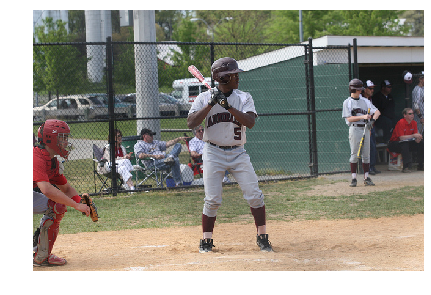

In [55]:
# look at validation prediction example
def apply_model_to_image_raw_bytes(raw):
    img = utils.decode_image_from_buf(raw)
    fig = plt.figure(figsize=(7, 7))
    plt.grid('off')
    plt.axis('off')
    plt.imshow(img)
    img = utils.crop_and_preprocess(img, (IMG_SIZE, IMG_SIZE), final_model.preprocess_for_model)
    print(' '.join(generate_caption(img)[1:-1]))
    plt.show()

def show_valid_example(val_img_fns, example_idx=0):
    zf = zipfile.ZipFile("val2014_sample.zip")
    all_files = set(val_img_fns)
    found_files = list(filter(lambda x: x.filename.rsplit("/")[-1] in all_files, zf.filelist))
    example = found_files[example_idx]
    apply_model_to_image_raw_bytes(zf.read(example))
    
show_valid_example(val_img_fns, example_idx=100)

/usr/local/lib/python3.6/dist-packages/matplotlib/cbook/__init__.py:424: MatplotlibDeprecationWarning: 
Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warn_deprecated("2.2", "Passing one of 'on', 'true', 'off', 'false' as a "


a black bear is standing in a small body of water


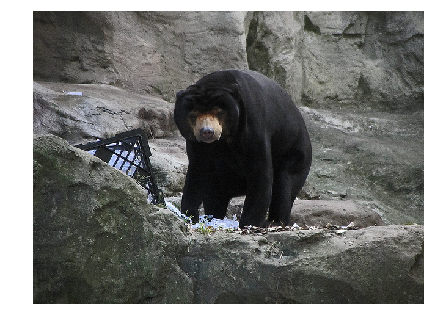

a train is parked on a track in a field


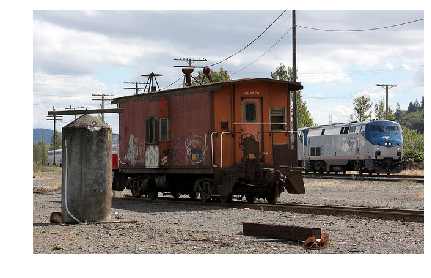

a group of people standing in a room with a tennis racket


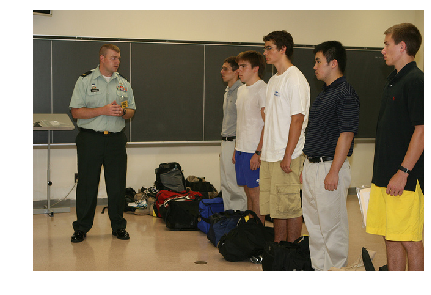

a young boy holding a skateboard in a park


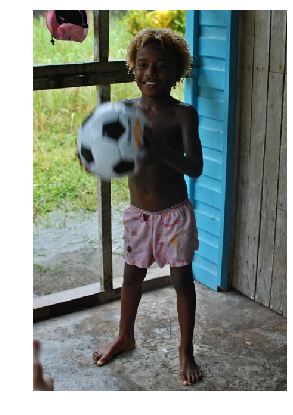

a group of people standing on a bench in a parking lot


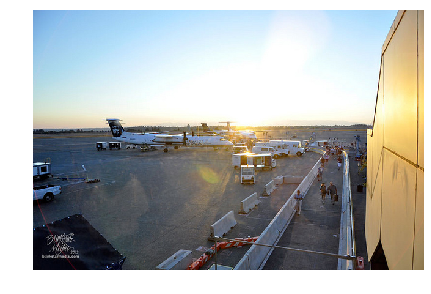

a baseball player is swinging a bat at a ball


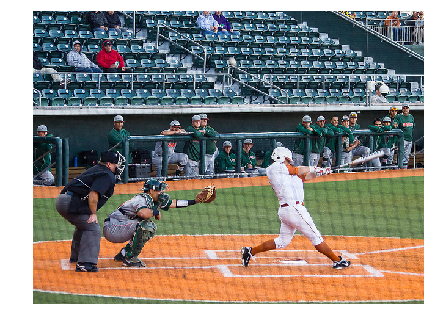

a baby elephant standing in a field with a tree


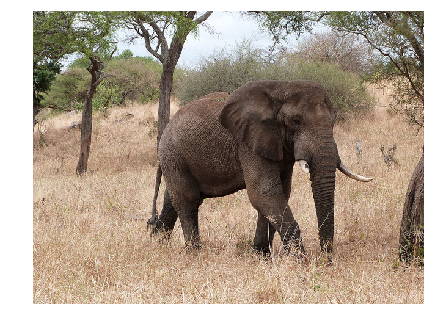

a truck driving down a street next to a street


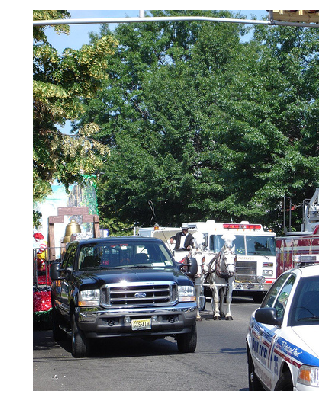

a bus driving down a street in front of a building


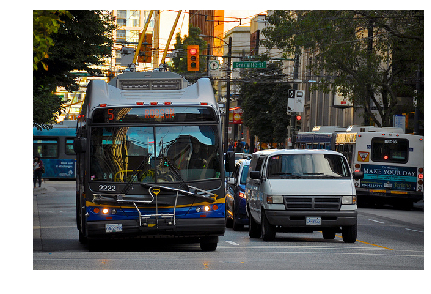

a woman sitting at a table with a plate of food


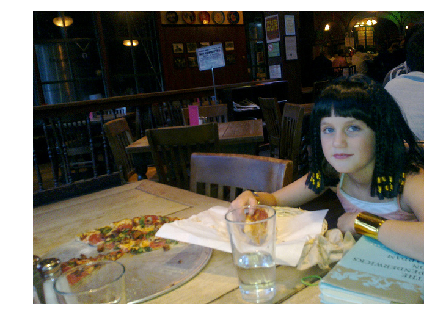

In [56]:
# sample more images from validation
for idx in np.random.choice(range(len(zipfile.ZipFile("val2014_sample.zip").filelist) - 1), 10):
    show_valid_example(val_img_fns, example_idx=idx)
    time.sleep(1)

You can download any image from the Internet and appply your model to it!

In [65]:
! wget http://www.bijouxandbits.com/wp-content/uploads/2016/06/portal-cake-10.jpg

--2019-08-24 19:44:49--  http://www.bijouxandbits.com/wp-content/uploads/2016/06/portal-cake-10.jpg
Resolving www.bijouxandbits.com (www.bijouxandbits.com)... 151.101.2.159
Connecting to www.bijouxandbits.com (www.bijouxandbits.com)|151.101.2.159|:80... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: https://www.bijouxandbits.com/wp-content/uploads/2016/06/portal-cake-10.jpg [following]
--2019-08-24 19:44:49--  https://www.bijouxandbits.com/wp-content/uploads/2016/06/portal-cake-10.jpg
Connecting to www.bijouxandbits.com (www.bijouxandbits.com)|151.101.2.159|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 273364 (267K) [image/jpeg]
Saving to: ‘portal-cake-10.jpg’

portal-cake-10.jpg  100%[===================>] 266.96K  --.-KB/s    in 0.07s   

2019-08-24 19:44:49 (3.50 MB/s) - ‘portal-cake-10.jpg’ saved [273364/273364]



/usr/local/lib/python3.6/dist-packages/matplotlib/cbook/__init__.py:424: MatplotlibDeprecationWarning: 
Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warn_deprecated("2.2", "Passing one of 'on', 'true', 'off', 'false' as a "


a white plate topped with a cake with a fork


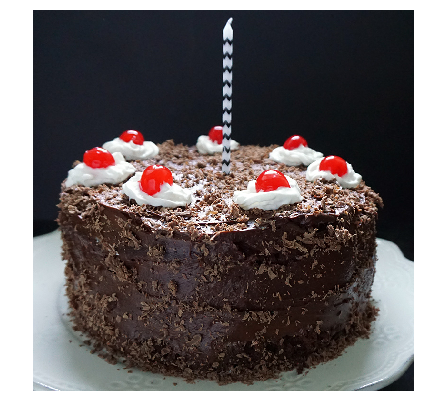

In [66]:
apply_model_to_image_raw_bytes(open("portal-cake-10.jpg", "rb").read())

Now it's time to find 10 examples where your model works good and 10 examples where it fails! 

You can use images from validation set as follows:
```python
show_valid_example(val_img_fns, example_idx=...)
```

You can use images from the Internet as follows:
```python
! wget ...
apply_model_to_image_raw_bytes(open("...", "rb").read())
```

If you use these functions, the output will be embedded into your notebook and will be visible during peer review!

When you're done, download your noteboook using "File" -> "Download as" -> "Notebook" and prepare that file for peer review!

**10 Examples where model work (Perfectly and Partially)**

**1. "a group of people standing on a skate board"**

--2019-08-24 19:43:24--  https://wallpapercave.com/wp/ZDpGHyX.jpg
Resolving wallpapercave.com (wallpapercave.com)... 51.79.72.220
Connecting to wallpapercave.com (wallpapercave.com)|51.79.72.220|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 353581 (345K) [image/jpeg]
Saving to: ‘ZDpGHyX.jpg’

ZDpGHyX.jpg         100%[===================>] 345.29K  --.-KB/s    in 0.08s   

2019-08-24 19:43:24 (4.44 MB/s) - ‘ZDpGHyX.jpg’ saved [353581/353581]



/usr/local/lib/python3.6/dist-packages/matplotlib/cbook/__init__.py:424: MatplotlibDeprecationWarning: 
Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warn_deprecated("2.2", "Passing one of 'on', 'true', 'off', 'false' as a "


a group of people standing on a skate board


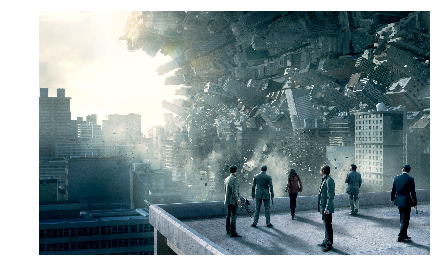

In [64]:
### YOUR EXAMPLES HERE ###
! wget https://wallpapercave.com/wp/ZDpGHyX.jpg
apply_model_to_image_raw_bytes(open("ZDpGHyX.jpg", "rb").read())

**2. "a group of people sitting at a table with a plate of food"**

--2019-08-24 20:46:10--  https://previews.123rf.com/images/wavebreakmediamicro/wavebreakmediamicro1507/wavebreakmediamicro150718118/42402085-young-business-people-having-lunch-together.jpg
Resolving previews.123rf.com (previews.123rf.com)... 104.121.80.132
Connecting to previews.123rf.com (previews.123rf.com)|104.121.80.132|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 148532 (145K) [image/jpeg]
Saving to: ‘42402085-young-business-people-having-lunch-together.jpg.1’

42402085-young-busi 100%[===================>] 145.05K  --.-KB/s    in 0.04s   

2019-08-24 20:46:11 (3.93 MB/s) - ‘42402085-young-business-people-having-lunch-together.jpg.1’ saved [148532/148532]



/usr/local/lib/python3.6/dist-packages/matplotlib/cbook/__init__.py:424: MatplotlibDeprecationWarning: 
Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warn_deprecated("2.2", "Passing one of 'on', 'true', 'off', 'false' as a "


a group of people sitting at a table with a plate of food


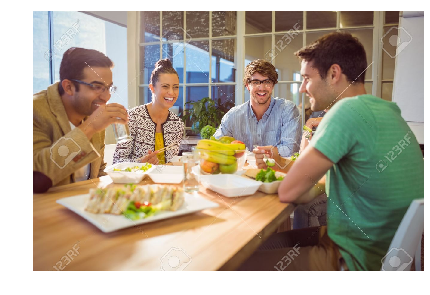

In [103]:
! wget https://previews.123rf.com/images/wavebreakmediamicro/wavebreakmediamicro1507/wavebreakmediamicro150718118/42402085-young-business-people-having-lunch-together.jpg
apply_model_to_image_raw_bytes(open("42402085-young-business-people-having-lunch-together.jpg", "rb").read())

**3. "a man is swinging a tennis racket at a ball"**

--2019-08-24 20:47:28--  https://upload.wikimedia.org/wikipedia/commons/8/8e/Roger_Federer_2012_Indian_Wells.jpg
Resolving upload.wikimedia.org (upload.wikimedia.org)... 208.80.154.240, 2620:0:861:ed1a::2:b
Connecting to upload.wikimedia.org (upload.wikimedia.org)|208.80.154.240|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 5743827 (5.5M) [image/jpeg]
Saving to: ‘Roger_Federer_2012_Indian_Wells.jpg.2’

Roger_Federer_2012_ 100%[===================>]   5.48M  23.6MB/s    in 0.2s    

2019-08-24 20:47:28 (23.6 MB/s) - ‘Roger_Federer_2012_Indian_Wells.jpg.2’ saved [5743827/5743827]



/usr/local/lib/python3.6/dist-packages/matplotlib/cbook/__init__.py:424: MatplotlibDeprecationWarning: 
Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warn_deprecated("2.2", "Passing one of 'on', 'true', 'off', 'false' as a "


a man is swinging a tennis racket at a ball


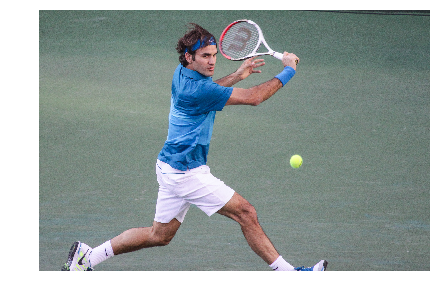

In [105]:
! wget https://upload.wikimedia.org/wikipedia/commons/8/8e/Roger_Federer_2012_Indian_Wells.jpg 
apply_model_to_image_raw_bytes(open("Roger_Federer_2012_Indian_Wells.jpg", "rb").read())

**4. "
a man riding a skateboard down a street"**

--2019-08-24 20:52:03--  https://media-cdn.tripadvisor.com/media/photo-s/02/5c/30/96/a-man-ice-skating.jpg
Resolving media-cdn.tripadvisor.com (media-cdn.tripadvisor.com)... 93.184.215.11
Connecting to media-cdn.tripadvisor.com (media-cdn.tripadvisor.com)|93.184.215.11|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 20919 (20K) [image/jpeg]
Saving to: ‘a-man-ice-skating.jpg.1’

a-man-ice-skating.j 100%[===================>]  20.43K  --.-KB/s    in 0s      

2019-08-24 20:52:03 (331 MB/s) - ‘a-man-ice-skating.jpg.1’ saved [20919/20919]

a man riding a skateboard down a street


/usr/local/lib/python3.6/dist-packages/matplotlib/cbook/__init__.py:424: MatplotlibDeprecationWarning: 
Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warn_deprecated("2.2", "Passing one of 'on', 'true', 'off', 'false' as a "


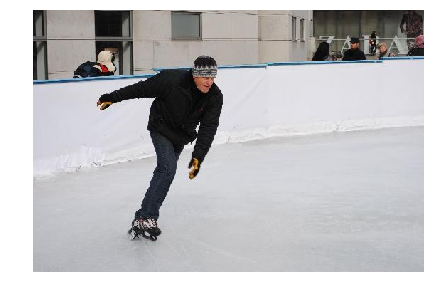

In [106]:
! wget https://media-cdn.tripadvisor.com/media/photo-s/02/5c/30/96/a-man-ice-skating.jpg
apply_model_to_image_raw_bytes(open("a-man-ice-skating.jpg", "rb").read())

**5. "a group of people playing a game of basketball"**

--2019-08-24 20:54:08--  http://www.womencantalksports.com/wp-content/uploads/2014/03/texas__tech_at_illinois_game_action.jpg
Resolving www.womencantalksports.com (www.womencantalksports.com)... 74.208.236.161
Connecting to www.womencantalksports.com (www.womencantalksports.com)|74.208.236.161|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 88686 (87K) [image/jpeg]
Saving to: ‘texas__tech_at_illinois_game_action.jpg.1’

texas__tech_at_illi 100%[===================>]  86.61K  --.-KB/s    in 0.1s    

2019-08-24 20:54:09 (640 KB/s) - ‘texas__tech_at_illinois_game_action.jpg.1’ saved [88686/88686]



/usr/local/lib/python3.6/dist-packages/matplotlib/cbook/__init__.py:424: MatplotlibDeprecationWarning: 
Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warn_deprecated("2.2", "Passing one of 'on', 'true', 'off', 'false' as a "


a group of people playing a game of basketball


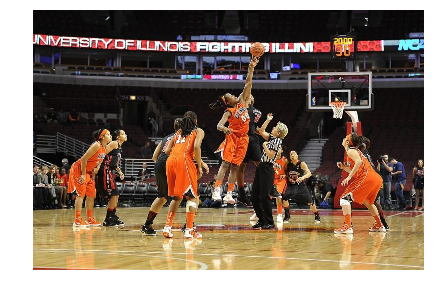

In [107]:
! wget http://www.womencantalksports.com/wp-content/uploads/2014/03/texas__tech_at_illinois_game_action.jpg
apply_model_to_image_raw_bytes(open("texas__tech_at_illinois_game_action.jpg", "rb").read())

**6. "a cat laying on a rug in a room"**

--2019-08-24 20:57:07--  https://www.nationalgeographic.com/content/dam/news/2018/05/17/you-can-train-your-cat/02-cat-training-NationalGeographic_1484324.jpg
Resolving www.nationalgeographic.com (www.nationalgeographic.com)... 23.195.64.193
Connecting to www.nationalgeographic.com (www.nationalgeographic.com)|23.195.64.193|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 249726 (244K) [image/jpeg]
Saving to: ‘02-cat-training-NationalGeographic_1484324.jpg.1’

02-cat-training-Nat 100%[===================>] 243.87K  --.-KB/s    in 0.04s   

2019-08-24 20:57:07 (5.67 MB/s) - ‘02-cat-training-NationalGeographic_1484324.jpg.1’ saved [249726/249726]



/usr/local/lib/python3.6/dist-packages/matplotlib/cbook/__init__.py:424: MatplotlibDeprecationWarning: 
Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warn_deprecated("2.2", "Passing one of 'on', 'true', 'off', 'false' as a "


a cat laying on a rug in a room


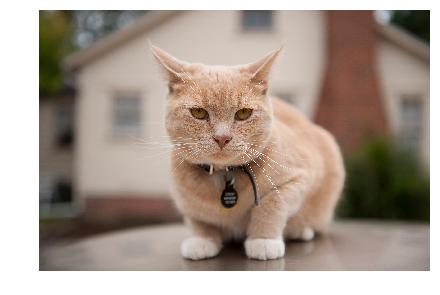

In [108]:
! wget https://www.nationalgeographic.com/content/dam/news/2018/05/17/you-can-train-your-cat/02-cat-training-NationalGeographic_1484324.jpg
apply_model_to_image_raw_bytes(open("02-cat-training-NationalGeographic_1484324.jpg", "rb").read())

**7. "a man in a suit and tie standing on a sidewalk"**

--2019-08-24 20:59:17--  https://www.lightsedgestudios.com/wp-content/uploads/2010/11/walking-back-from-the-show.jpg
Resolving www.lightsedgestudios.com (www.lightsedgestudios.com)... 104.24.110.178, 104.24.111.178, 2606:4700:30::6818:6eb2, ...
Connecting to www.lightsedgestudios.com (www.lightsedgestudios.com)|104.24.110.178|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 173887 (170K) [image/jpeg]
Saving to: ‘walking-back-from-the-show.jpg.1’

walking-back-from-t 100%[===================>] 169.81K  --.-KB/s    in 0.03s   

2019-08-24 20:59:17 (5.74 MB/s) - ‘walking-back-from-the-show.jpg.1’ saved [173887/173887]



/usr/local/lib/python3.6/dist-packages/matplotlib/cbook/__init__.py:424: MatplotlibDeprecationWarning: 
Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warn_deprecated("2.2", "Passing one of 'on', 'true', 'off', 'false' as a "


a man in a suit and tie standing on a sidewalk


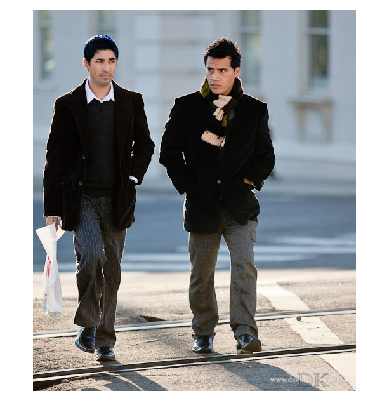

In [109]:
! wget https://www.lightsedgestudios.com/wp-content/uploads/2010/11/walking-back-from-the-show.jpg
apply_model_to_image_raw_bytes(open("walking-back-from-the-show.jpg","rb").read())

**8. "a baseball player swinging a bat at a ball"**

--2019-08-24 21:01:42--  https://s.marketwatch.com/public/resources/images/MW-DU117_david__ZH_20150913112300.jpg
Resolving s.marketwatch.com (s.marketwatch.com)... 13.226.42.16, 13.226.42.120, 13.226.42.68, ...
Connecting to s.marketwatch.com (s.marketwatch.com)|13.226.42.16|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 159463 (156K) [image/jpeg]
Saving to: ‘MW-DU117_david__ZH_20150913112300.jpg.2’

MW-DU117_david__ZH_ 100%[===================>] 155.73K  --.-KB/s    in 0.06s   

2019-08-24 21:01:42 (2.45 MB/s) - ‘MW-DU117_david__ZH_20150913112300.jpg.2’ saved [159463/159463]



/usr/local/lib/python3.6/dist-packages/matplotlib/cbook/__init__.py:424: MatplotlibDeprecationWarning: 
Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warn_deprecated("2.2", "Passing one of 'on', 'true', 'off', 'false' as a "


a baseball player swinging a bat at a ball


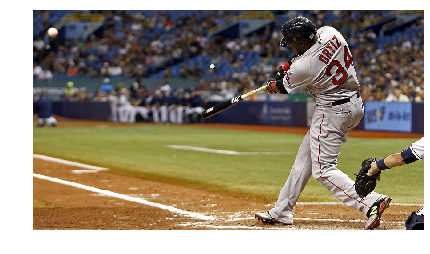

In [111]:
! wget https://s.marketwatch.com/public/resources/images/MW-DU117_david__ZH_20150913112300.jpg
apply_model_to_image_raw_bytes(open("MW-DU117_david__ZH_20150913112300.jpg","rb").read())

**9. "a group of trucks parked on a street"**

--2019-08-24 21:03:55--  https://daily.jstor.org/wp-content/uploads/2017/12/traffic_jam_1050x700.jpg
Resolving daily.jstor.org (daily.jstor.org)... 23.185.0.2, 2620:12a:8001::2, 2620:12a:8000::2
Connecting to daily.jstor.org (daily.jstor.org)|23.185.0.2|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 704907 (688K) [image/jpeg]
Saving to: ‘traffic_jam_1050x700.jpg.1’

traffic_jam_1050x70 100%[===================>] 688.39K  --.-KB/s    in 0.06s   

2019-08-24 21:03:55 (10.9 MB/s) - ‘traffic_jam_1050x700.jpg.1’ saved [704907/704907]



/usr/local/lib/python3.6/dist-packages/matplotlib/cbook/__init__.py:424: MatplotlibDeprecationWarning: 
Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warn_deprecated("2.2", "Passing one of 'on', 'true', 'off', 'false' as a "


a group of trucks parked on a street


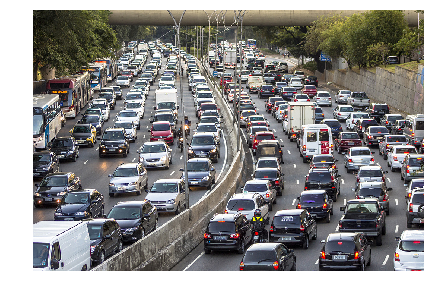

In [112]:
! wget https://daily.jstor.org/wp-content/uploads/2017/12/traffic_jam_1050x700.jpg
apply_model_to_image_raw_bytes(open("traffic_jam_1050x700.jpg","rb").read())

**10. "a vase with a bouquet of flowers on it"**

--2019-08-24 21:38:13--  https://fyf.tac-cdn.net/images/products/small/BF116-11KM.jpg
Resolving fyf.tac-cdn.net (fyf.tac-cdn.net)... 151.101.201.177
Connecting to fyf.tac-cdn.net (fyf.tac-cdn.net)|151.101.201.177|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 27880 (27K) [image/jpeg]
Saving to: ‘BF116-11KM.jpg’

BF116-11KM.jpg      100%[===================>]  27.23K  --.-KB/s    in 0.01s   

2019-08-24 21:38:13 (2.16 MB/s) - ‘BF116-11KM.jpg’ saved [27880/27880]



/usr/local/lib/python3.6/dist-packages/matplotlib/cbook/__init__.py:424: MatplotlibDeprecationWarning: 
Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warn_deprecated("2.2", "Passing one of 'on', 'true', 'off', 'false' as a "


a vase with a bouquet of flowers on it


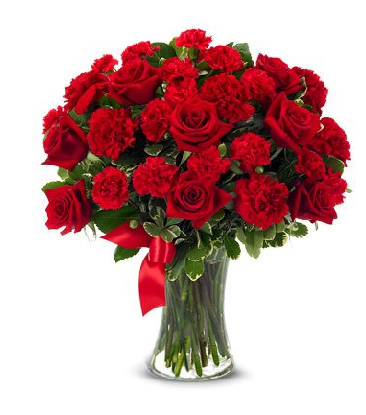

In [127]:
! wget https://fyf.tac-cdn.net/images/products/small/BF116-11KM.jpg
apply_model_to_image_raw_bytes(open("BF116-11KM.jpg","rb").read())

**10 Examples where model Fail**

**1. "a person riding a bike on a dirt road"**

--2019-08-24 21:09:56--  https://s3.amazonaws.com/craft-prod-assets/assets/_alternatingBlocks/02_Card_Grid_Matrix_Athlete_Development_Road_430x430.jpg
Resolving s3.amazonaws.com (s3.amazonaws.com)... 52.216.236.189
Connecting to s3.amazonaws.com (s3.amazonaws.com)|52.216.236.189|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 82771 (81K) [image/jpeg]
Saving to: ‘02_Card_Grid_Matrix_Athlete_Development_Road_430x430.jpg.1’

02_Card_Grid_Matrix 100%[===================>]  80.83K  --.-KB/s    in 0.1s    

2019-08-24 21:09:56 (627 KB/s) - ‘02_Card_Grid_Matrix_Athlete_Development_Road_430x430.jpg.1’ saved [82771/82771]



/usr/local/lib/python3.6/dist-packages/matplotlib/cbook/__init__.py:424: MatplotlibDeprecationWarning: 
Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warn_deprecated("2.2", "Passing one of 'on', 'true', 'off', 'false' as a "


a person riding a bike on a dirt road


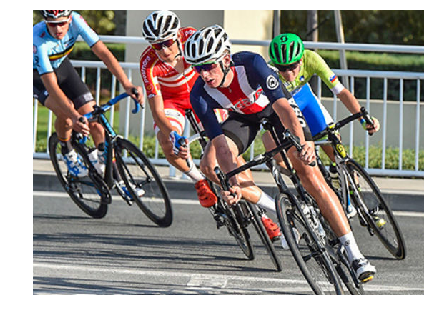

In [114]:
! wget https://s3.amazonaws.com/craft-prod-assets/assets/_alternatingBlocks/02_Card_Grid_Matrix_Athlete_Development_Road_430x430.jpg
apply_model_to_image_raw_bytes(open("02_Card_Grid_Matrix_Athlete_Development_Road_430x430.jpg","rb").read())

**2. "a group of people standing next to a bird"**

--2019-08-24 21:11:36--  https://www.yourdictionary.com/image/articles/22636.troop-of-monkeys.jpg
Resolving www.yourdictionary.com (www.yourdictionary.com)... 13.35.115.11, 13.35.115.68, 13.35.115.116, ...
Connecting to www.yourdictionary.com (www.yourdictionary.com)|13.35.115.11|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 92823 (91K) [image/jpg]
Saving to: ‘22636.troop-of-monkeys.jpg.1’

22636.troop-of-monk 100%[===================>]  90.65K  --.-KB/s    in 0.05s   

2019-08-24 21:11:37 (1.68 MB/s) - ‘22636.troop-of-monkeys.jpg.1’ saved [92823/92823]



/usr/local/lib/python3.6/dist-packages/matplotlib/cbook/__init__.py:424: MatplotlibDeprecationWarning: 
Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warn_deprecated("2.2", "Passing one of 'on', 'true', 'off', 'false' as a "


a group of people standing next to a bird


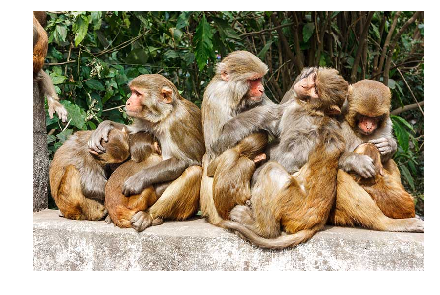

In [115]:
! wget https://www.yourdictionary.com/image/articles/22636.troop-of-monkeys.jpg
apply_model_to_image_raw_bytes(open("22636.troop-of-monkeys.jpg","rb").read())

**3. "a large white and white bird standing on a ledge"**

--2019-08-24 21:13:22--  https://amp.businessinsider.com/images/56d9ff8f2e52651d008bb9bd-750-563.jpg
Resolving amp.businessinsider.com (amp.businessinsider.com)... 151.101.1.171, 151.101.65.171, 151.101.129.171, ...
Connecting to amp.businessinsider.com (amp.businessinsider.com)|151.101.1.171|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 109546 (107K) [image/jpeg]
Saving to: ‘56d9ff8f2e52651d008bb9bd-750-563.jpg.2’

56d9ff8f2e52651d008 100%[===================>] 106.98K  --.-KB/s    in 0.04s   

2019-08-24 21:13:22 (2.83 MB/s) - ‘56d9ff8f2e52651d008bb9bd-750-563.jpg.2’ saved [109546/109546]



/usr/local/lib/python3.6/dist-packages/matplotlib/cbook/__init__.py:424: MatplotlibDeprecationWarning: 
Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warn_deprecated("2.2", "Passing one of 'on', 'true', 'off', 'false' as a "


a large white and white bird standing on a ledge


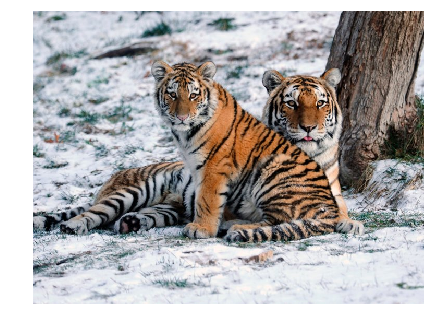

In [116]:
! wget https://amp.businessinsider.com/images/56d9ff8f2e52651d008bb9bd-750-563.jpg
apply_model_to_image_raw_bytes(open("56d9ff8f2e52651d008bb9bd-750-563.jpg","rb").read()) 

**4. "a man wearing a red tie and a red tie"**

--2019-08-24 21:15:33--  https://wp-media.patheos.com/blogs/sites/507/2013/05/woman-crying.jpg
Resolving wp-media.patheos.com (wp-media.patheos.com)... 152.195.32.219
Connecting to wp-media.patheos.com (wp-media.patheos.com)|152.195.32.219|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 50067 (49K) [image/jpeg]
Saving to: ‘woman-crying.jpg.1’

woman-crying.jpg.1  100%[===================>]  48.89K  --.-KB/s    in 0.01s   

2019-08-24 21:15:33 (3.74 MB/s) - ‘woman-crying.jpg.1’ saved [50067/50067]



/usr/local/lib/python3.6/dist-packages/matplotlib/cbook/__init__.py:424: MatplotlibDeprecationWarning: 
Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warn_deprecated("2.2", "Passing one of 'on', 'true', 'off', 'false' as a "


a man wearing a red tie and a red tie


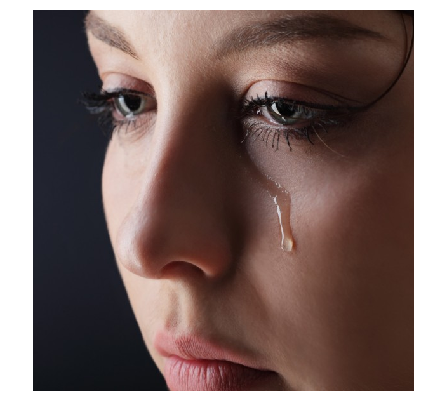

In [117]:
! wget https://wp-media.patheos.com/blogs/sites/507/2013/05/woman-crying.jpg
apply_model_to_image_raw_bytes(open("woman-crying.jpg","rb").read())

**5. "a man wearing a suit and tie standing in front of a wall"**

--2019-08-24 21:17:04--  https://relevantmagazine.com/wp-content/uploads/2019/04/ThanosWasRight.jpg
Resolving relevantmagazine.com (relevantmagazine.com)... 151.101.66.159
Connecting to relevantmagazine.com (relevantmagazine.com)|151.101.66.159|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 414046 (404K) [image/jpeg]
Saving to: ‘ThanosWasRight.jpg.1’

ThanosWasRight.jpg. 100%[===================>] 404.34K  --.-KB/s    in 0.07s   

2019-08-24 21:17:04 (5.38 MB/s) - ‘ThanosWasRight.jpg.1’ saved [414046/414046]



/usr/local/lib/python3.6/dist-packages/matplotlib/cbook/__init__.py:424: MatplotlibDeprecationWarning: 
Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warn_deprecated("2.2", "Passing one of 'on', 'true', 'off', 'false' as a "


a man wearing a suit and tie standing in front of a wall


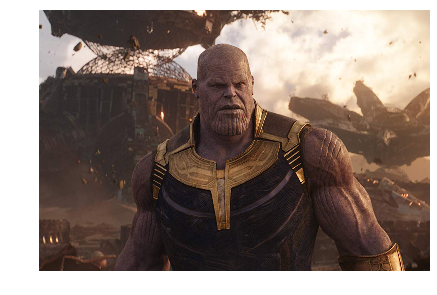

In [118]:
! wget https://relevantmagazine.com/wp-content/uploads/2019/04/ThanosWasRight.jpg
apply_model_to_image_raw_bytes(open("ThanosWasRight.jpg","rb").read())

**6. "a man is holding a frisbee in his mouth"**

--2019-08-24 21:20:03--  https://www.bostonmagazine.com/wp-content/uploads/sites/2/2019/05/Great-white-shark.jpg
Resolving www.bostonmagazine.com (www.bostonmagazine.com)... 71.19.234.34
Connecting to www.bostonmagazine.com (www.bostonmagazine.com)|71.19.234.34|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 97620 (95K) [image/jpeg]
Saving to: ‘Great-white-shark.jpg’

Great-white-shark.j 100%[===================>]  95.33K  --.-KB/s    in 0.02s   

2019-08-24 21:20:04 (3.74 MB/s) - ‘Great-white-shark.jpg’ saved [97620/97620]



/usr/local/lib/python3.6/dist-packages/matplotlib/cbook/__init__.py:424: MatplotlibDeprecationWarning: 
Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warn_deprecated("2.2", "Passing one of 'on', 'true', 'off', 'false' as a "


a man is holding a frisbee in his mouth


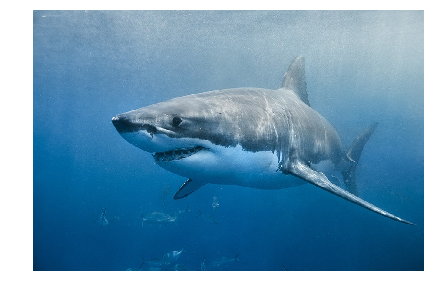

In [119]:
! wget https://www.bostonmagazine.com/wp-content/uploads/sites/2/2019/05/Great-white-shark.jpg
apply_model_to_image_raw_bytes(open("Great-white-shark.jpg","rb").read())

**7. "a person is standing on a rail in front of a plane"**

--2019-08-24 21:25:44--  https://s.abcnews.com/images/US/branch-davidian-fire-01-gty-jc-180103_16x9_992.jpg
Resolving s.abcnews.com (s.abcnews.com)... 13.35.115.60, 13.35.115.35, 13.35.115.69, ...
Connecting to s.abcnews.com (s.abcnews.com)|13.35.115.60|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 77688 (76K) [image/jpeg]
Saving to: ‘branch-davidian-fire-01-gty-jc-180103_16x9_992.jpg’

branch-davidian-fir 100%[===================>]  75.87K  --.-KB/s    in 0.07s   

2019-08-24 21:25:44 (1.00 MB/s) - ‘branch-davidian-fire-01-gty-jc-180103_16x9_992.jpg’ saved [77688/77688]



/usr/local/lib/python3.6/dist-packages/matplotlib/cbook/__init__.py:424: MatplotlibDeprecationWarning: 
Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warn_deprecated("2.2", "Passing one of 'on', 'true', 'off', 'false' as a "


a person is standing on a rail in front of a plane


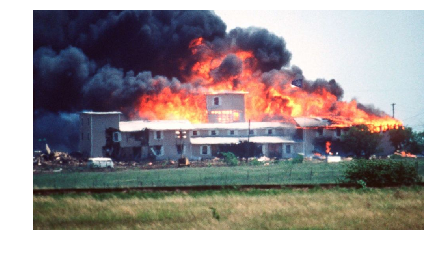

In [122]:
! wget https://s.abcnews.com/images/US/branch-davidian-fire-01-gty-jc-180103_16x9_992.jpg
apply_model_to_image_raw_bytes(open("branch-davidian-fire-01-gty-jc-180103_16x9_992.jpg", "rb").read())

**8. "a man is holding a baseball bat in his hand"**

--2019-08-24 21:30:10--  https://amp.businessinsider.com/images/58d245d1dd089516408b4b09-750-563.jpg
Resolving amp.businessinsider.com (amp.businessinsider.com)... 151.101.1.171, 151.101.65.171, 151.101.129.171, ...
Connecting to amp.businessinsider.com (amp.businessinsider.com)|151.101.1.171|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 53856 (53K) [image/jpeg]
Saving to: ‘58d245d1dd089516408b4b09-750-563.jpg.3’

58d245d1dd089516408 100%[===================>]  52.59K  --.-KB/s    in 0.03s   

2019-08-24 21:30:10 (2.05 MB/s) - ‘58d245d1dd089516408b4b09-750-563.jpg.3’ saved [53856/53856]



/usr/local/lib/python3.6/dist-packages/matplotlib/cbook/__init__.py:424: MatplotlibDeprecationWarning: 
Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warn_deprecated("2.2", "Passing one of 'on', 'true', 'off', 'false' as a "


a man is holding a baseball bat in his hand


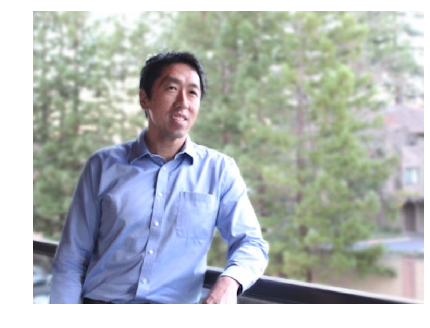

In [123]:
! wget https://amp.businessinsider.com/images/58d245d1dd089516408b4b09-750-563.jpg
apply_model_to_image_raw_bytes(open("58d245d1dd089516408b4b09-750-563.jpg","rb").read())

**9. "a person sitting on a bench in front of a toilet"**

--2019-08-24 21:34:15--  http://3.bp.blogspot.com/-2IHKWrao4Ko/T65EEof6t2I/AAAAAAAAAUk/Nj3EGnuyJVk/s1600/Asimo-Service.jpg
Resolving 3.bp.blogspot.com (3.bp.blogspot.com)... 74.125.141.132, 2607:f8b0:400c:c06::84
Connecting to 3.bp.blogspot.com (3.bp.blogspot.com)|74.125.141.132|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 241227 (236K) [image/jpeg]
Saving to: ‘Asimo-Service.jpg’

Asimo-Service.jpg   100%[===================>] 235.57K  --.-KB/s    in 0.001s  

2019-08-24 21:34:15 (191 MB/s) - ‘Asimo-Service.jpg’ saved [241227/241227]



/usr/local/lib/python3.6/dist-packages/matplotlib/cbook/__init__.py:424: MatplotlibDeprecationWarning: 
Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warn_deprecated("2.2", "Passing one of 'on', 'true', 'off', 'false' as a "


a person sitting on a bench in front of a toilet


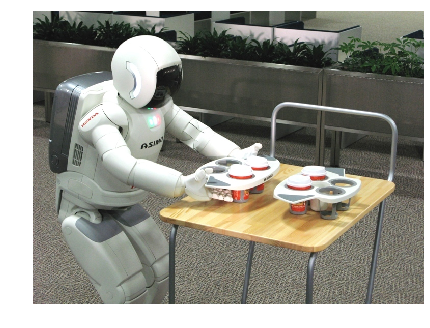

In [125]:
! wget http://3.bp.blogspot.com/-2IHKWrao4Ko/T65EEof6t2I/AAAAAAAAAUk/Nj3EGnuyJVk/s1600/Asimo-Service.jpg
apply_model_to_image_raw_bytes(open("Asimo-Service.jpg","rb").read())

**10. "a large white and blue train on a track"**

--2019-08-24 21:46:38--  https://www.swri.org/sites/default/files/styles/client_services_banner/public/client-services-images/AdobeStock_52996053.jpeg
Resolving www.swri.org (www.swri.org)... 52.87.65.167
Connecting to www.swri.org (www.swri.org)|52.87.65.167|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 54762 (53K) [image/jpeg]
Saving to: ‘AdobeStock_52996053.jpeg’

AdobeStock_52996053 100%[===================>]  53.48K  --.-KB/s    in 0.03s   

2019-08-24 21:46:39 (1.63 MB/s) - ‘AdobeStock_52996053.jpeg’ saved [54762/54762]



/usr/local/lib/python3.6/dist-packages/matplotlib/cbook/__init__.py:424: MatplotlibDeprecationWarning: 
Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warn_deprecated("2.2", "Passing one of 'on', 'true', 'off', 'false' as a "


a large white and blue train on a track


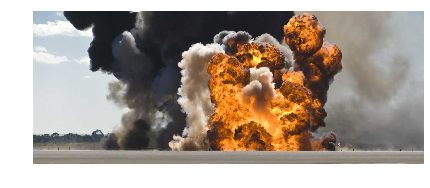

In [130]:
! wget https://www.swri.org/sites/default/files/styles/client_services_banner/public/client-services-images/AdobeStock_52996053.jpeg
apply_model_to_image_raw_bytes(open("AdobeStock_52996053.jpeg","rb").read())

That's it! 

Congratulations, you've trained your image captioning model and now can produce captions for any picture from the  Internet!